<a href="https://colab.research.google.com/github/LivroRelampagos/Estudo_de_Caso/blob/main/rastreamento_tempestades_FCTH_lagrangeano.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **RASTREAMENTO DE TEMPESTADES POR RADAR**


---


**OBJETIVO:** Programa que rastreia tempestades da campanha CHUVA-Vale 


---


**DADOS DE ENTRADA**: Dados de radar e relâmpagos. Esses dados são baixados automaticamente do dropbox para o drive momentâneo do Colab. 

1.   Arquivos binários de refletividade (em dBZ) do **radar da FCTH**: *cappi_CZ_03000_20120109_1703.dat.gz*
2.   Arquivos ASCII de relâmpagos da **BrasilDAT**: *flashEVM_BRASILDAT_20120101.txt.gz*
3.   Arquivos ASCII de relâmpagos da **SPLMA**: *2012-01-09_00-22-59.6434_37_v01.txt*


---
**DADOS DE SAÍDA:**


1.   CAPPI na **área total** do radar: *tempestade_7_cappi_3km_Z_FCTH_20120109_1703.jpg*
2.   CAPPI com **zoom** na tempestade: *tempestade_7_zoom_cappi_3km_Z_FCTH_20120109_1703*
3.   **Animação** dos CAPPI com zoom: *animation_tempestade_7.gif*
4.   **Painel** com CAPPI com zoom: *painel_tempestade_7.png*
5.   Arquivo ascii com informações do **rastreamento**: *rastreamento_tempestade_7.txt*
6.   Arquivo ascii com informações dos **relâmpagos**: *tempestade_7_20120109_1703.csv*

---
**PROCEDIMENTO REALIZADO:** Os seguintes procedimentos são realizados nesse código:
1.   Instalação de bibliotecas
2.   Importação das bibliotecas
3.   Download de arquivos auxiliares
4.   Importa funções
5.   Leitura dos horários da tempestade e latitudes e longitudes de rastreamento
6.   Download dos dados de radar, Brasildat e SPLMA que estão no Dropbox
7.   Descompacta os dados baixados
6.   Declara as informações do radar
7.   Leitura do arquivo diário da brasildat
8.   Seleção dos arquuivos da splma daquele dia 
9.   Plota CAPPI de 3 km de refletividade de todos horários para área total do radar
10.  Plota CAPPI de 3 km de refletividade de todos horários para área com zoom
11.  Faz video de animação das imagens com zoom
12.  Seleciona CAPPI de alguns horários e plota em forma de painel

 
---
**OBSERVAÇÕES IMPORTANTES**: 
1. Fazer mudanças, veja em: **### >>> MUDANÇAS AQUI <<< ###**
    - 1. Caminho do seu drive 
    - 2. Número da tempestade
    - 3. Rastreamento da tempestade

---
- **Realizado por:** Enrique V. Mattos - 11/12/2021
- **Atualizado por:** Enrique V. Mattos e Raquel Gonçalves Pereira - 10/03/2022







# **### >>> MUDANÇAS AQUI <<< ###**

- **Insira o caminho do seu drive**: alterar aqui

In [ ]:
dir = '/content/drive/MyDrive/Mestrado/LIVRO_RAQUEL/'

- **Caminhos dos diretórios**: aqui não precisa alterar

In [ ]:
import os

# definindo os diretórios de entrada/saída 
path_input = f'{dir}1_rastreamento_tempestades_radar_FCTH/input_listas_tempestades/' # caminho do arquivo com os horários daquele tempestade
path_output = f'{dir}1_rastreamento_tempestades_radar_FCTH/output/' # caminho onde as figuras serão salvas

# definindo os diretórios dos dados de radar, splma e brasildat 
dir_dados_radar = f'{dir}dados_radar_fcth/' # diretório dos dados de RADAR
dir_dados_splma = f'{dir}dados_splma/' # diretório dos dados de relâmpagos da SPLMA
dir_dados_brasildat = f'{dir}dados_brasildat/' # diretório dos dados de relâmpagos da BRASILDAT

# definindo o diretório dos shapefiles 
dir_shapefiles = f'{dir}shapefiles/' # diretório dos arquivo de shapefiles

# exibe na tela
print(path_input)
print(path_output)

/content/drive/MyDrive/Mestrado/LIVRO_RAQUEL/1_rastreamento_tempestades_radar_FCTH/input_listas_tempestades/
/content/drive/MyDrive/Mestrado/LIVRO_RAQUEL/1_rastreamento_tempestades_radar_FCTH/output/


# **Instala Bibliotecas**

In [ ]:
# Instalando o cartopy (usado para gerar Mapas)
!apt-get install libproj-dev proj-data proj-bin
!apt-get install libgeos-dev
!pip install --no-binary shapely shapely --force
!pip install cartopy
print('\n')

# Instalando o proplot (usado para gerar Mapas também)
!pip install proplot==0.6.4
print('\n')

# Instalando o py_art (biblioteca para trabalhar com dados de radar)
!pip install arm_pyart
print('\n')

Reading package lists... Done
Building dependency tree       
Reading state information... Done
libproj-dev is already the newest version (4.9.3-2).
libproj-dev set to manually installed.
proj-data is already the newest version (4.9.3-2).
proj-data set to manually installed.
The following NEW packages will be installed:
  proj-bin
0 upgraded, 1 newly installed, 0 to remove and 39 not upgraded.
Need to get 32.3 kB of archives.
After this operation, 110 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 proj-bin amd64 4.9.3-2 [32.3 kB]
Fetched 32.3 kB in 1s (45.8 kB/s)
Selecting previously unselected package proj-bin.
(Reading database ... 155335 files and directories currently installed.)
Preparing to unpack .../proj-bin_4.9.3-2_amd64.deb ...
Unpacking proj-bin (4.9.3-2) ...
Setting up proj-bin (4.9.3-2) ...
Processing triggers for man-db (2.8.3-2ubuntu0.1) ...
Reading package lists... Done
Building dependency tree       
Reading state

# **Importa bibliotecas**

**importa bibliotecas**

In [ ]:
import pandas as pd
import numpy as np
import proplot as plot
import cartopy.crs as ccrs
import cartopy.io.shapereader as shpreader
import matplotlib.pyplot as plt
import os, glob
import pyart
import os
import gzip
import shutil
from tqdm import tqdm
import calendar
import matplotlib
import tarfile
from tqdm.notebook import tqdm_notebook
from datetime import datetime, timedelta
import xarray as xr
import imageio    # Python interface to read and write a wide range of image data

import warnings
warnings.filterwarnings("ignore")

/usr/local/lib/python3.7/dist-packages/proplot/config.py:1454: ProPlotWarning: Rebuilding font cache.



## You are using the Python ARM Radar Toolkit (Py-ART), an open source
## library for working with weather radar data. Py-ART is partly
## supported by the U.S. Department of Energy as part of the Atmospheric
## Radiation Measurement (ARM) Climate Research Facility, an Office of
## Science user facility.
##
## If you use this software to prepare a publication, please cite:
##
##     JJ Helmus and SM Collis, JORS 2016, doi: 10.5334/jors.119



/usr/local/lib/python3.7/dist-packages/yaml/constructor.py:126: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working
  if not isinstance(key, collections.Hashable):
/usr/local/lib/python3.7/dist-packages/dask/array/numpy_compat.py:21: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  np.divide(0.4, 1, casting="unsafe", dtype=np.float),
/usr/local/lib/python3.7/dist-packages/scipy/io/matlab/mio5.py:98: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any beha

**monta drive para salvar arquivos de saída**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Importa funções**

In [ ]:
#----------------------------------------------------------------------------------- 
#  Função que plota circulos de distância em geral 
#----------------------------------------------------------------------------------- 
def evm_plota_aneis_em_geral(aneis, lon_r, lat_r, color, label):

    """
    Retorna círculos de distância centrado no radar

    Parâmetros de entrada:
                aneis (lista): tamanho do raio do círculo em km 
                lon_r (float): valor da longitude do centro do círculo em graus  
                lat_r (float): valor da latitude do centro do círculo em graus 
                color (str): cor do raio do círculo
                label (str): legenda    

    Parâmetros de saída:
                latitude e longitude que delimita círculos de distância centrado no radar e plota os círculos
    """

    import geopy                                # Biblioteca para geocodificação
    from geopy import distance

    origin = geopy.Point(lat_r, lon_r)

    lons = np.zeros((len(aneis), 361))
    lats = np.zeros((len(aneis), 361))
    for i, dis in enumerate(aneis):
        xpts = []
        ypts = []
        for az in range(361):
            destination = distance.distance(kilometers=dis).destination(origin, az)
            lat2, lon2 = destination.latitude, destination.longitude
            xpts.append(lon2)
            ypts.append(lat2)
        lons[i,:] = xpts[:]
        lats[i,:] = ypts[:]   

    for i, anel in enumerate(aneis):
        ax.plot(lons[i,:], lats[i,:], color=color, label= label, linestyle='--')

#----------------------------------------------------------------------------------- 
# Função que plota os Estados 
#----------------------------------------------------------------------------------- 
def evm_plot_states(shapefile):
    
    """
    Retorna a plotagem dos contornos de um shapefile na figura

    Parâmetros de entrada:
                shapefile (shp): shapefile da regiao 
                
    Parâmetros de saída:
                figura com o contorno da região baseado no shapefile fornecido
    """
    import cartopy.crs as ccrs
    import cartopy.io.shapereader as shpreader
    import matplotlib.pyplot as plt

    shapefile = list(shpreader.Reader(shapefile).geometries())
    ax.add_geometries(shapefile, ccrs.PlateCarree(), edgecolor='black',facecolor='none', linewidth=1.0) 

# Criando a pasta de saída

In [ ]:
import os
os.makedirs(f'{path_output}', exist_ok=True)

# **Leitura dos horários da tempestade**

In [ ]:
'''------ Exemplo do arquivo ------
20111213 2210
20111213 2215
20111213 2220
20111213 2225
20111213 2230
20111213 2235
20111213 2240
20111213 2245
20111213 2250
20111213 2255
20111213 2300
20111213 2305
20111213 2310
20111213 2315
--------------------------------'''

# nome do arquivo
nome_lista = f'{path_input}horarios_tempestade.txt' # tempestade_7.txt

# leitura do arquivo
files_radar = []
with open(nome_lista, 'r') as arquivo:
    for linha in arquivo:
        linha = linha.rstrip()
        data, hora = linha.split(' ')
        files_radar.append(f'cappi_CZ_03000_{data}_{hora}.dat.gz')

# extrai o ano e mes da tempestade
anox = files_radar[0][15:19]
mesx = files_radar[0][19:21]
diax = files_radar[0][21:23]

# exibe na tela alguns parâmetros
print(anox, mesx, diax)
print(len(files_radar))
print(files_radar)

2012 01 09
23
['cappi_CZ_03000_20120109_1703.dat.gz', 'cappi_CZ_03000_20120109_1708.dat.gz', 'cappi_CZ_03000_20120109_1713.dat.gz', 'cappi_CZ_03000_20120109_1718.dat.gz', 'cappi_CZ_03000_20120109_1723.dat.gz', 'cappi_CZ_03000_20120109_1728.dat.gz', 'cappi_CZ_03000_20120109_1733.dat.gz', 'cappi_CZ_03000_20120109_1738.dat.gz', 'cappi_CZ_03000_20120109_1743.dat.gz', 'cappi_CZ_03000_20120109_1748.dat.gz', 'cappi_CZ_03000_20120109_1753.dat.gz', 'cappi_CZ_03000_20120109_1758.dat.gz', 'cappi_CZ_03000_20120109_1803.dat.gz', 'cappi_CZ_03000_20120109_1808.dat.gz', 'cappi_CZ_03000_20120109_1813.dat.gz', 'cappi_CZ_03000_20120109_1818.dat.gz', 'cappi_CZ_03000_20120109_1823.dat.gz', 'cappi_CZ_03000_20120109_1828.dat.gz', 'cappi_CZ_03000_20120109_1833.dat.gz', 'cappi_CZ_03000_20120109_1838.dat.gz', 'cappi_CZ_03000_20120109_1843.dat.gz', 'cappi_CZ_03000_20120109_1848.dat.gz', 'cappi_CZ_03000_20120109_1853.dat.gz']


In [ ]:
#files_radar = files_radar[4:6]
files_radar

['cappi_CZ_03000_20120109_1703.dat.gz',
 'cappi_CZ_03000_20120109_1708.dat.gz',
 'cappi_CZ_03000_20120109_1713.dat.gz',
 'cappi_CZ_03000_20120109_1718.dat.gz',
 'cappi_CZ_03000_20120109_1723.dat.gz',
 'cappi_CZ_03000_20120109_1728.dat.gz',
 'cappi_CZ_03000_20120109_1733.dat.gz',
 'cappi_CZ_03000_20120109_1738.dat.gz',
 'cappi_CZ_03000_20120109_1743.dat.gz',
 'cappi_CZ_03000_20120109_1748.dat.gz',
 'cappi_CZ_03000_20120109_1753.dat.gz',
 'cappi_CZ_03000_20120109_1758.dat.gz',
 'cappi_CZ_03000_20120109_1803.dat.gz',
 'cappi_CZ_03000_20120109_1808.dat.gz',
 'cappi_CZ_03000_20120109_1813.dat.gz',
 'cappi_CZ_03000_20120109_1818.dat.gz',
 'cappi_CZ_03000_20120109_1823.dat.gz',
 'cappi_CZ_03000_20120109_1828.dat.gz',
 'cappi_CZ_03000_20120109_1833.dat.gz',
 'cappi_CZ_03000_20120109_1838.dat.gz',
 'cappi_CZ_03000_20120109_1843.dat.gz',
 'cappi_CZ_03000_20120109_1848.dat.gz',
 'cappi_CZ_03000_20120109_1853.dat.gz']

# **Descompactando os dados**

In [ ]:
#-------------------------------------------------------#
#                     RADAR
#-------------------------------------------------------#
# Descompactando os dados do radar
print('destargeando arquivos do RADAR ---> ')
filename = 'cappi_CZ_radar_FCTH_2012-01-09.tar.gz'

tar_file = tarfile.open(f'{dir_dados_radar}{filename}')
tar_file.getnames()
tar_file.extractall()

#-------------------------------------------------------#
#                     SPLMA
#-------------------------------------------------------#
# Descompactando os dados do splma
print('destargeando arquivos da rede SPLMA ---> ')
filename = 'splma_2012-01-09_level2.tar.gz'

tar_file = tarfile.open(f'{dir_dados_splma}{filename}')
tar_file.getnames()
tar_file.extractall()

destargeando arquivos do RADAR ---> 
destargeando arquivos da rede SPLMA ---> 


# **Informações do radar**

In [ ]:
# número de colunas e linhas da matriz do radar
nx, ny = 500, 500

# área da matriz do radar
lonmin, lonmax, latmin, latmax = -48.4564, -43.4780, -25.8367, -21.3360 

# localização do radar
lat_radar, lon_radar = -23.6000, -45.9722

# resolução espacial em graus da lat e lon (=0.01 graus)
dx = (lonmax-lonmin)/(nx-1)
dy = (latmax-latmin)/(ny-1)

# cria matriz de latitudes e longitudes
lat = np.linspace(latmin, latmax, ny) 
lon = np.linspace(lonmin, lonmax, nx)

# reprojeta as lons e lats do radar para uma matriz bidimensional
lon, lat = np.meshgrid(lon, lat)

# **Leitura arquivo Brasildat do "DIA"**
- São listados num DataFrame os arquivos de relâmpagos da **Brasildat** daquele dia

In [ ]:
# leitura do arquivo da brasildat
df_bra = pd.read_csv(f'{dir_dados_brasildat}flashEVM_BRASILDAT_{anox}{mesx}{diax}.txt.gz', delimiter='\s+', compression='gzip', 
                     usecols=['tipo', 'ano', 'mes', 'dia', 'hor', 'min', 'seg', 'lat', 'lon', 'pc(A)', 'mult_certa']) # /content/flashEVM_BRASILDAT_20120101.txt.gz

# calcula distância do relâmpago ao radar
dis = (np.sqrt( (df_bra['lat'].values - lat_radar)**2 +  (df_bra['lon'].values - lon_radar)**2 ) ) * 111.195

# adiciona a colunas com as distâncias no DataFrame "df_bra"
df_bra['distancia'] = dis

# seleciona relâmpagos que estão <= 190 km do radar
df_bra2 = df_bra[ df_bra['distancia'] <= 190 ]

# criando a coluna "data" e transformando-a em formato Datetime
dfx = df_bra2[['ano', 'mes','dia','hor','min','seg']]
dfx = dfx.rename(columns={'ano':'year', 'mes':'month', 'dia':'day', 'hor':'hour', 'min':'minute', 'seg':'second'})
df_bra2['data'] = pd.to_datetime(dfx)

# seta a 'data' como índice da tabela
df_bra2.set_index('data', inplace=True)
df_bra2

,tipo,ano,mes,dia,hor,min,seg,lat,lon,pc(A),mult_certa,distancia
data,,,,,,,,,,,,
2012-01-09 00:04:23.999406784,IC,2012,1,9,0,4,23.999407,-21.951281,-46.247659,-2.7,0,185.870379
2012-01-09 00:15:21.868295550,IC,2012,1,9,0,15,21.868296,-23.151047,-44.449343,17.3,0,176.539433
2012-01-09 00:15:21.886672496,IC,2012,1,9,0,15,21.886672,-23.140654,-44.450285,-5.0,0,176.769442
2012-01-09 00:18:59.720757216,IC,2012,1,9,0,18,59.720757,-23.143218,-44.466616,8.4,0,174.948788
2012-01-09 00:22:59.661777675,IC,2012,1,9,0,22,59.661778,-23.634190,-45.570579,6.3,0,44.819793
...,...,...,...,...,...,...,...,...,...,...,...,...
2012-01-09 23:59:54.556335330,IC,2012,1,9,23,59,54.556335,-22.881442,-47.405841,6.2,0,178.316473
2012-01-09 23:59:54.560139209,IC,2012,1,9,23,59,54.560139,-22.883801,-47.408476,3.3,0,178.461227
2012-01-09 23:59:54.611444056,IC,2012,1,9,23,59,54.611444,-22.846547,-47.416935,-1.9,0,181.181352


# **Monta listas de arquivos da SPLMA do "DIA"**
- São listados num DataFrame os arquivos de relâmpagos da **SPLMA** daquele dia

In [ ]:
# Monta uma lista contendo os arquivos da SPLMA dentro daquele "DIA"
files_lma = sorted(glob.glob(f'/content/{anox}-{mesx}-{diax}*'))

# Extrai a data do nome do arquivo
files_lma2 = [file_lma[9:33] for file_lma in files_lma]

# Cria o dataframe
dados = {'data': files_lma2, 'nome': files_lma}
df_arqlma = pd.DataFrame(dados, columns=['data','nome'])

# Transforma para datetime
df_arqlma['data'] = pd.to_datetime(df_arqlma['data'], format='%Y-%m-%d_%H-%M-%S.%f')

# Seta o index
df_arqlma.set_index('data', inplace=True)
df_arqlma

,nome
data,
2012-01-09 00:22:59.643400,/content/2012-01-09_00-22-59.6434_37_v01.txt
2012-01-09 00:32:59.279800,/content/2012-01-09_00-32-59.2798_14_v01.txt
2012-01-09 00:37:41.730800,/content/2012-01-09_00-37-41.7308_27_v01.txt
2012-01-09 00:39:47.022500,/content/2012-01-09_00-39-47.0225_60_v01.txt
2012-01-09 00:41:19.119500,/content/2012-01-09_00-41-19.1195_28_v01.txt
...,...
2012-01-09 23:58:26.448000,/content/2012-01-09_23-58-26.4480_164_v01.txt
2012-01-09 23:58:59.759200,/content/2012-01-09_23-58-59.7592_44_v01.txt
2012-01-09 23:59:11.547400,/content/2012-01-09_23-59-11.5474_97_v01.txt


In [ ]:
files_lma2

['2012-01-09_00-22-59.6434',
 '2012-01-09_00-32-59.2798',
 '2012-01-09_00-37-41.7308',
 '2012-01-09_00-39-47.0225',
 '2012-01-09_00-41-19.1195',
 '2012-01-09_00-42-40.0926',
 '2012-01-09_00-42-49.1775',
 '2012-01-09_00-43-48.5565',
 '2012-01-09_00-44-41.0640',
 '2012-01-09_00-48-46.0731',
 '2012-01-09_14-39-43.7506',
 '2012-01-09_14-54-48.3974',
 '2012-01-09_14-55-19.5162',
 '2012-01-09_14-55-33.1857',
 '2012-01-09_14-55-58.9023',
 '2012-01-09_14-56-18.4551',
 '2012-01-09_14-56-37.9373',
 '2012-01-09_14-56-58.3912',
 '2012-01-09_14-57-15.1737',
 '2012-01-09_14-58-18.4963',
 '2012-01-09_14-59-18.8434',
 '2012-01-09_15-30-03.3899',
 '2012-01-09_15-40-05.2196',
 '2012-01-09_15-40-38.2140',
 '2012-01-09_15-42-02.5381',
 '2012-01-09_15-47-09.1911',
 '2012-01-09_16-06-03.0070',
 '2012-01-09_16-06-59.4831',
 '2012-01-09_16-07-49.8271',
 '2012-01-09_16-08-17.9265',
 '2012-01-09_16-10-47.2966',
 '2012-01-09_16-11-36.0240',
 '2012-01-09_16-12-36.3926',
 '2012-01-09_16-13-07.8702',
 '2012-01-09_1

# **1) Plota CAPPI**: forma individual e área total

In [ ]:
files_radar

['cappi_CZ_03000_20120109_1703.dat.gz',
 'cappi_CZ_03000_20120109_1708.dat.gz',
 'cappi_CZ_03000_20120109_1713.dat.gz',
 'cappi_CZ_03000_20120109_1718.dat.gz',
 'cappi_CZ_03000_20120109_1723.dat.gz',
 'cappi_CZ_03000_20120109_1728.dat.gz',
 'cappi_CZ_03000_20120109_1733.dat.gz',
 'cappi_CZ_03000_20120109_1738.dat.gz',
 'cappi_CZ_03000_20120109_1743.dat.gz',
 'cappi_CZ_03000_20120109_1748.dat.gz',
 'cappi_CZ_03000_20120109_1753.dat.gz',
 'cappi_CZ_03000_20120109_1758.dat.gz',
 'cappi_CZ_03000_20120109_1803.dat.gz',
 'cappi_CZ_03000_20120109_1808.dat.gz',
 'cappi_CZ_03000_20120109_1813.dat.gz',
 'cappi_CZ_03000_20120109_1818.dat.gz',
 'cappi_CZ_03000_20120109_1823.dat.gz',
 'cappi_CZ_03000_20120109_1828.dat.gz',
 'cappi_CZ_03000_20120109_1833.dat.gz',
 'cappi_CZ_03000_20120109_1838.dat.gz',
 'cappi_CZ_03000_20120109_1843.dat.gz',
 'cappi_CZ_03000_20120109_1848.dat.gz',
 'cappi_CZ_03000_20120109_1853.dat.gz']

  0%|          | 0/23 [00:00<?, ?it/s]

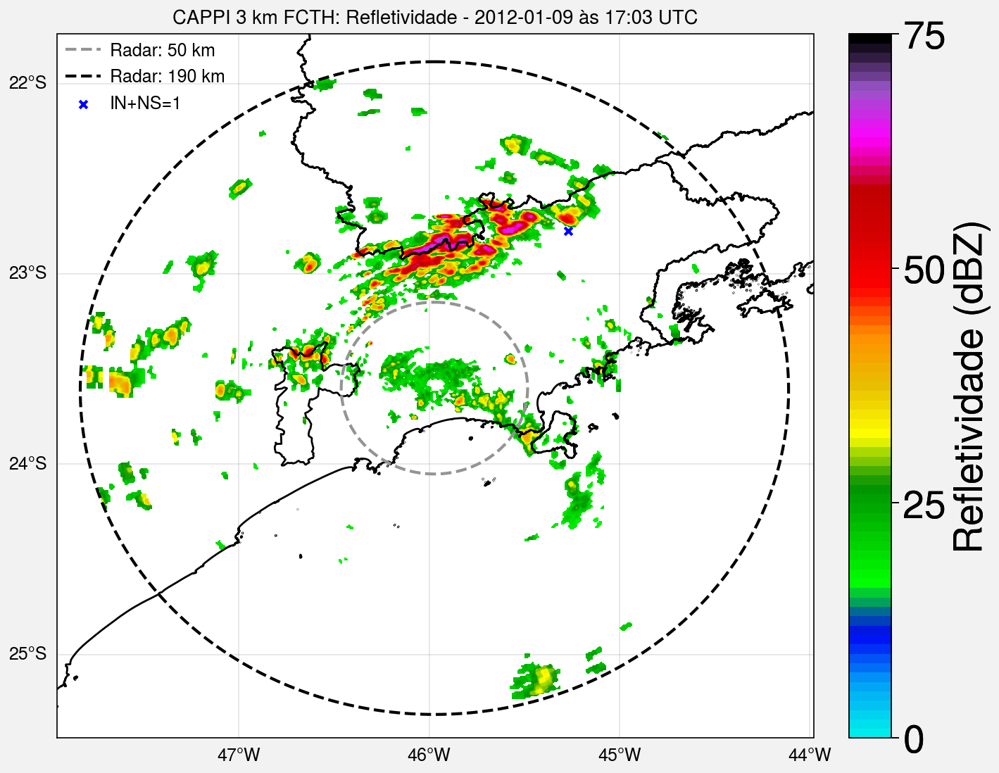

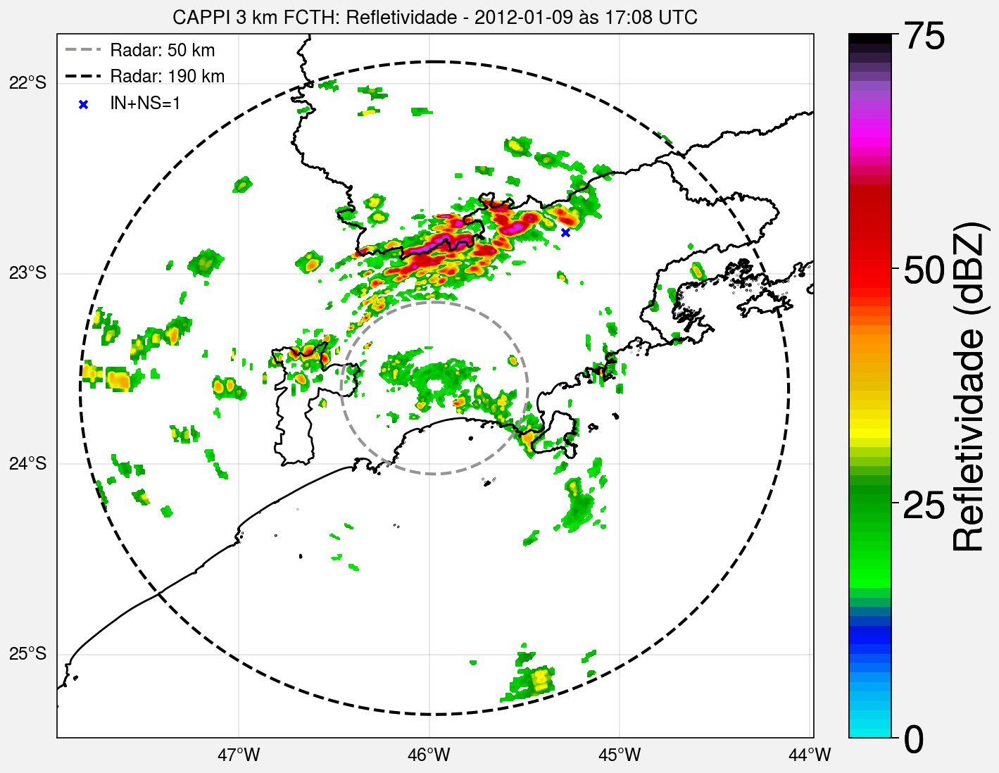

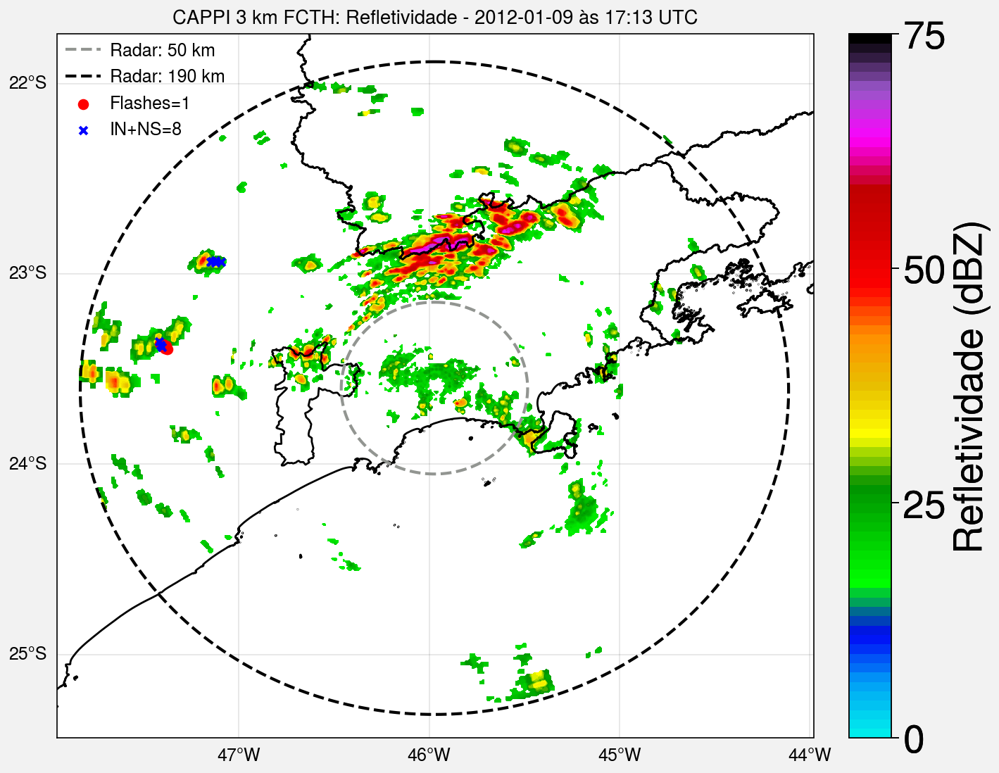

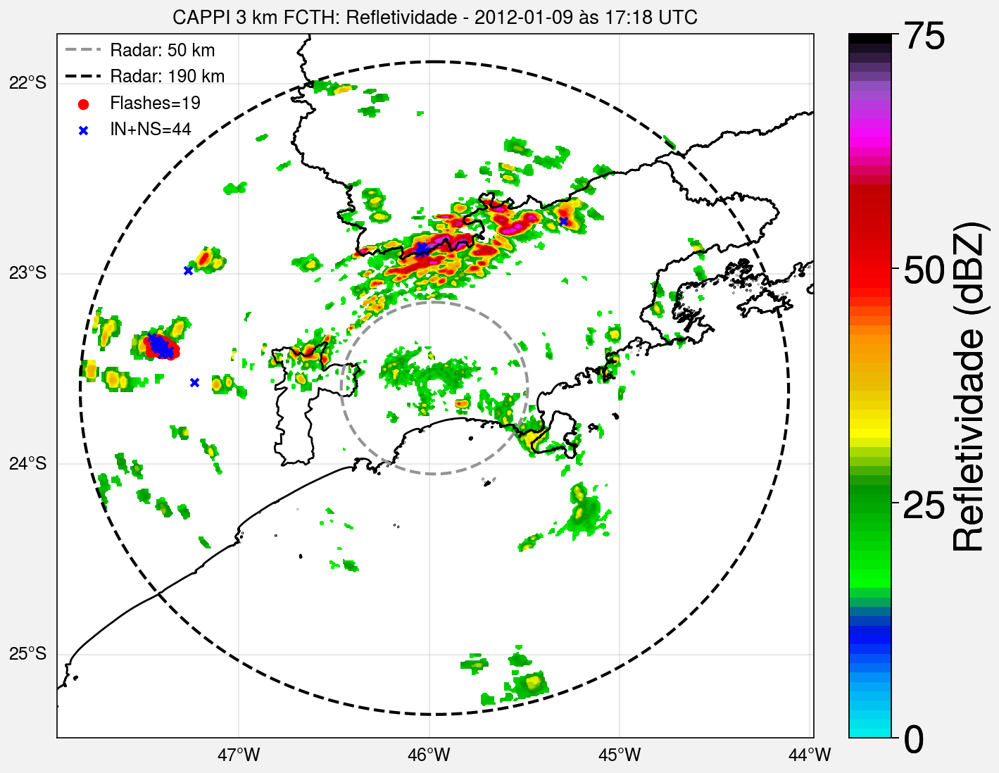

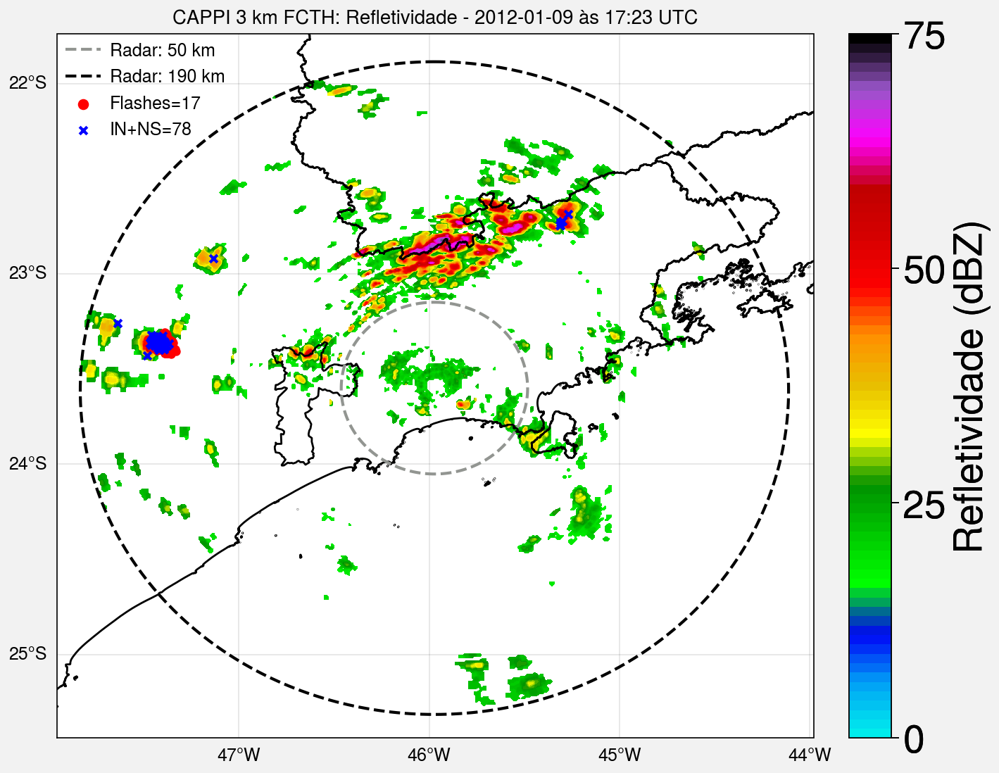

...

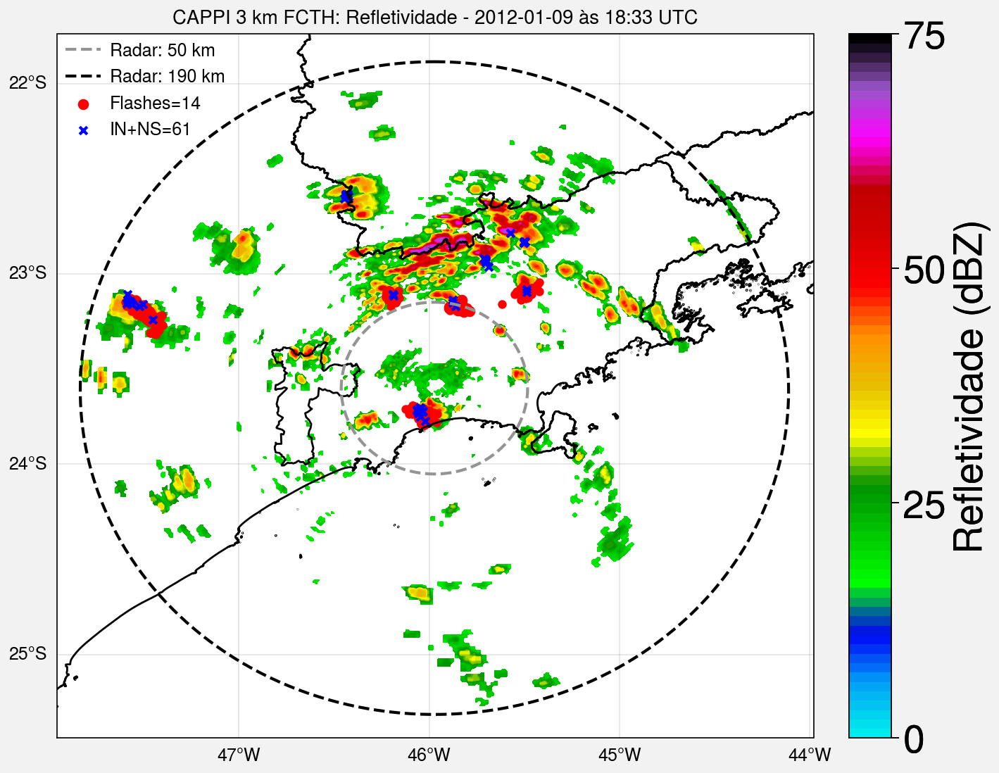

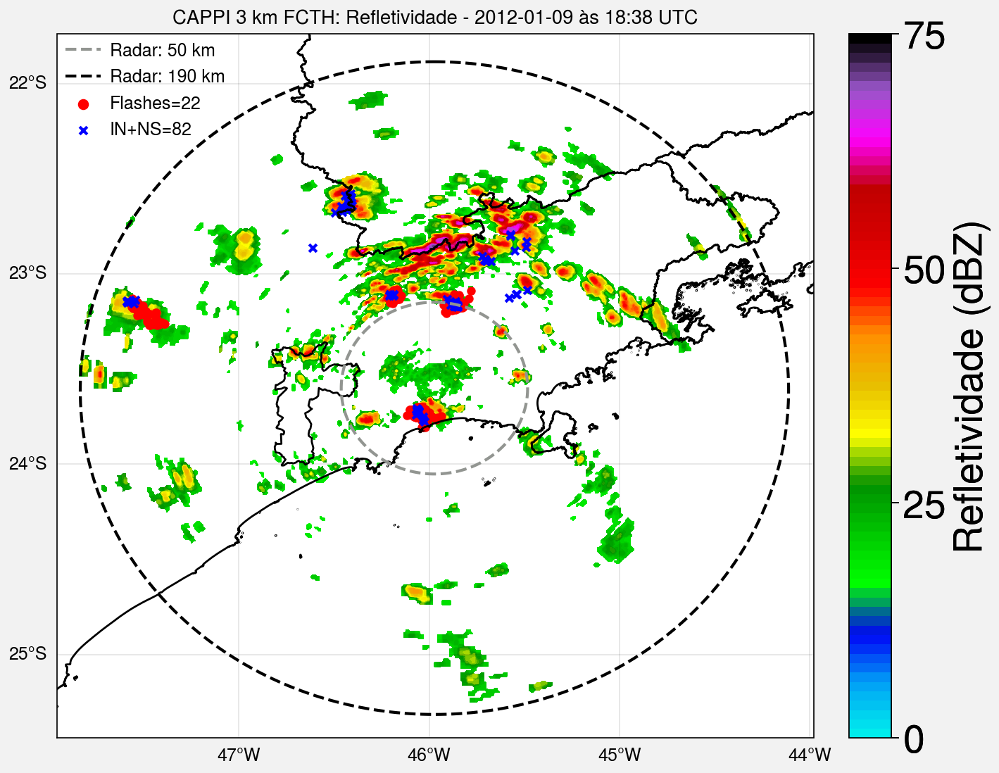

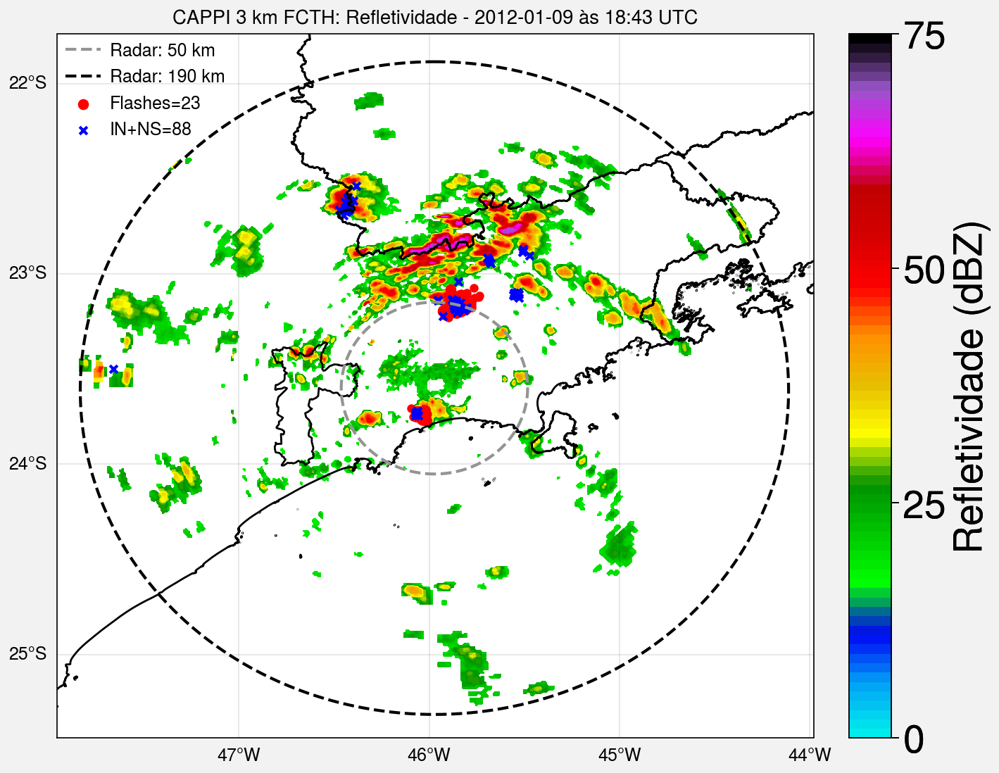

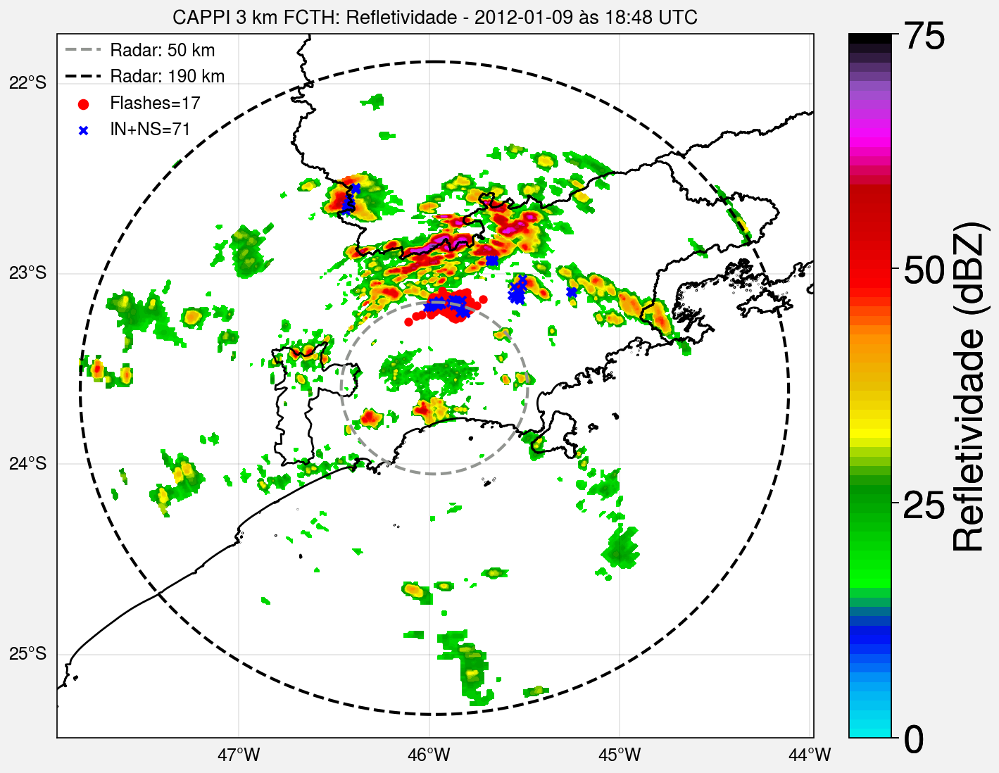

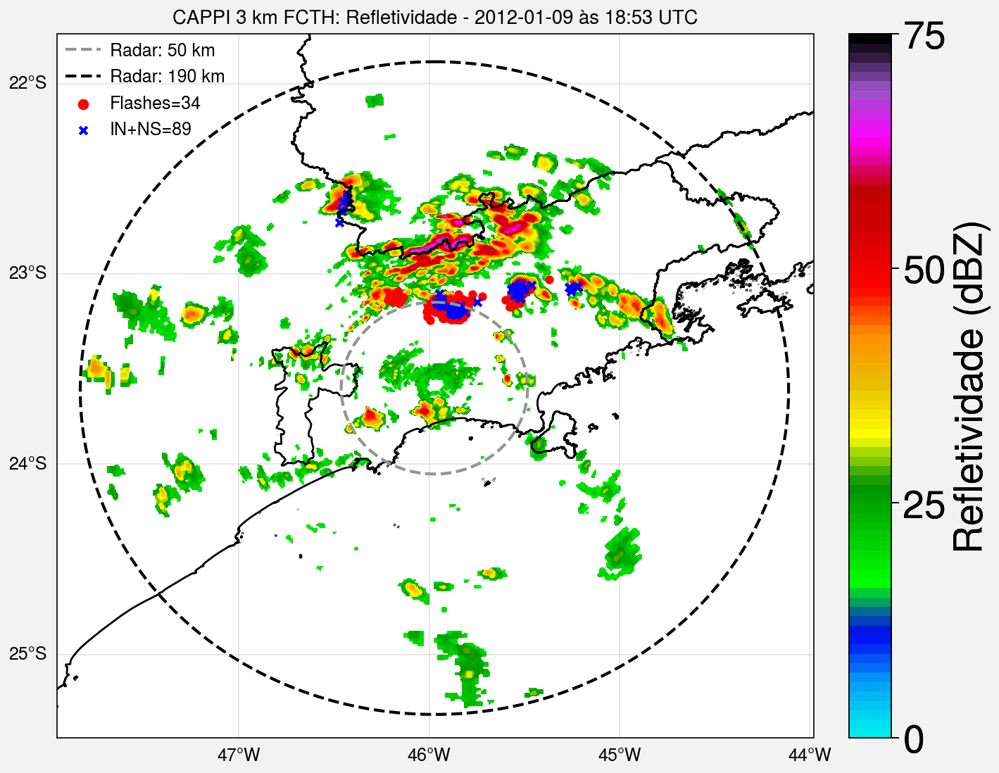

In [ ]:
# Loop das imagens do radar
for file in tqdm_notebook(files_radar):
    
    # Nome zipado e dzipado do arquivo 
    filename_gz = file
    filename = filename_gz[0:-3]
    
    # Extrai data e hora
    ano, mes, dia, hor, minu = filename[15:19], filename[19:21], filename[21:23], filename[24:26], filename[26:28]

    # Data inicial e final do ScanTime do radar em formato de "CARACTER"
    data_str_ini = str(datetime(int(ano), int(mes), int(dia), int(hor), int(minu), 0, 1))
    data_str_end = str(datetime.strptime(data_str_ini, '%Y-%m-%d %H:%M:%S.%f') + timedelta(minutes=4, seconds=59, microseconds=999998))

    # Descompacta arquivo .gz 
    with gzip.open(f'/content/{filename_gz}', 'rb') as entrada:
        with open(f'/content/{filename}', 'wb') as saida:
            shutil.copyfileobj(entrada, saida)
        
    # Leitura do dado
    dados0 = np.fromfile(f'/content/{filename}', np.float32)
    dados1 = dados0.reshape(ny, nx)            
    dados = np.ma.masked_array(dados1, dados1 < 0.)  

    # É necessário inverter o eixo y (é o eixo das latiudes):
    #dados = np.flipud(dados) 

    #------------------------------------------------------#
    #               Plota figura
    #------------------------------------------------------# 
    # cria a moldura da figura
    fig, ax = plot.subplots(axheight=5, tight=True, proj='pcarree')

    # formatação dos eixos
    ax.format(coast=False, borders=False, innerborders=False, labels=True, latlines=1, lonlines=1,
              title=f'CAPPI 3 km FCTH: Refletividade - {ano}-{mes}-{dia} às {hor}:{minu} UTC', 
              latlim=(latmin+0.4, latmax-0.4), lonlim=(lonmin+0.5, lonmax-0.5), fontsize=11)

    # plota contornos 
    evm_plot_states(f'{dir_shapefiles}BR_UF_2019.shp')
    evm_plot_states(f'{dir_shapefiles}shapefile_rmsp.shp')

    # plota figura
    map1 = ax.contourf(lon, lat, dados, cmap='pyart_NWSRef', levels=plot.arange(0., 75., 1.0))

    # plota os aneis de distância do radar
    evm_plota_aneis_em_geral([50], lon_radar, lat_radar, 'gray', label='Radar: 50 km')
    evm_plota_aneis_em_geral([190], lon_radar, lat_radar, 'black', label='Radar: 190 km')

    # plota barra de cores
    fig.colorbar(map1, loc='r', label='Refletividade (dBZ)', ticks=25, ticklabelsize=20, labelsize=20, width=0.3)

    #------------------------------------------------------#
    #                 Plota SPLMA
    #------------------------------------------------------# 
    # Procura arquivos da SPLMA dentro do tempo do ScanTime do radar
    df_arqlma2 = df_arqlma.loc[data_str_ini : data_str_end]
    nfiles_lma = df_arqlma2.shape[0]

    i=0
    flashes_lma = 0 # contador de relâmpagos da SPLMA dentro do ScanTime do radar
    for j, filex in df_arqlma2.iterrows():

        # leitura do arquivo
        df_lma = pd.read_csv(filex['nome'], delimiter='\s+')

        # calcula distância em km dos relâmpagos em relação ao centro do radar
        dis = (np.sqrt( (df_lma['lat'].values - lat_radar)**2 +  (df_lma['lon'].values - lon_radar)**2 ) ) * 111.195
        df_lma['distancia'] = dis

        # seleciona relâmpagos que estão <= 190 km do radar
        df_lmax = df_lma[ df_lma['distancia'] <= 190 ]
        nfontes_lma = df_lmax.shape[0]
            
        # se teve alguma fonte que caiu dentro da área do radar (ie, < 190 km do radar)
        if (nfontes_lma >= 1): 

            # quantidade de flashes da rede SPLMA
            flashes_lma+=1

            # último aquivo de LMA
            if (i == nfiles_lma-1):
                ax.scatter(df_lmax['lon'].values, df_lmax['lat'].values, transform=ccrs.PlateCarree(), marker='o', s=25, color='red', label=f'Flashes={str(flashes_lma)}')             
            
            # segundo em diante arquivo de lma
            else:
                ax.scatter(df_lmax['lon'].values, df_lmax['lat'].values, transform=ccrs.PlateCarree(), marker='o', s=15, color='red') 
                
        i+=1

    #------------------------------------------------------#
    #               Plota Brasildat
    #------------------------------------------------------# 
    # Procura na tabela da Brasildat, relâmpagos dentro do tempo do relâmpago da SPLMA
    df_bra4 = df_bra2.loc[data_str_ini : data_str_end]

    # plota os relâmpagos
    ax.scatter(df_bra4['lon'].values, df_bra4['lat'].values, transform=ccrs.PlateCarree(), marker='x', s=15, color='b', label=f'IN+NS={str(df_bra4.shape[0])}') 
    #------------------------------------------------------# 

    # adiciona legenda
    ax.legend(loc='ul', ncols=1, frameon=False)

    # salva figura
    fig.save(f'{path_output}cappi_3km_Z_FCTH_{ano}{mes}{dia}_{hor}{minu}.jpg', dpi=300)  

    #break  

# **2) Plota CAPPI**: forma individual e área com zoom

**Área de recorte**

In [ ]:
#############################################
#               RECORTE
#############################################
# Área de recorte (subset da matriz)
lonmin_rec = -47.4
lonmax_rec = -46.8

latmin_rec = -23.2
latmax_rec = -22.6

lats = np.linspace(latmin, latmax, ny) 
lons = np.linspace(lonmin, lonmax, nx)

**### >>> MUDANÇAS AQUI <<< ###**: Área de rastreamento

In [ ]:
#files_radar = files_radar[0]
files_radar

['cappi_CZ_03000_20120109_1703.dat.gz',
 'cappi_CZ_03000_20120109_1708.dat.gz',
 'cappi_CZ_03000_20120109_1713.dat.gz',
 'cappi_CZ_03000_20120109_1718.dat.gz',
 'cappi_CZ_03000_20120109_1723.dat.gz',
 'cappi_CZ_03000_20120109_1728.dat.gz',
 'cappi_CZ_03000_20120109_1733.dat.gz',
 'cappi_CZ_03000_20120109_1738.dat.gz',
 'cappi_CZ_03000_20120109_1743.dat.gz',
 'cappi_CZ_03000_20120109_1748.dat.gz',
 'cappi_CZ_03000_20120109_1753.dat.gz',
 'cappi_CZ_03000_20120109_1758.dat.gz',
 'cappi_CZ_03000_20120109_1803.dat.gz',
 'cappi_CZ_03000_20120109_1808.dat.gz',
 'cappi_CZ_03000_20120109_1813.dat.gz',
 'cappi_CZ_03000_20120109_1818.dat.gz',
 'cappi_CZ_03000_20120109_1823.dat.gz',
 'cappi_CZ_03000_20120109_1828.dat.gz',
 'cappi_CZ_03000_20120109_1833.dat.gz',
 'cappi_CZ_03000_20120109_1838.dat.gz',
 'cappi_CZ_03000_20120109_1843.dat.gz',
 'cappi_CZ_03000_20120109_1848.dat.gz',
 'cappi_CZ_03000_20120109_1853.dat.gz']

In [ ]:
def delimita_storm(hormin):
    
    """
    Retorna os limites do quadrado de rastreamento da tempestade

    Parâmetros de entrada:
                hormin (str): hora e minuto da imagem de radar. Exemplo: '1703' 

    Parâmetros de saída:
                lonmin_rast (float): longitude mínima do quadrado de rastreamento 
                lonmax_rast (float): longitude máxima do quadrado de rastreamento
                latmin_rast (float): latitude mínima do quadrado de rastreamento 
                latmax_rast (float): latitude máxima do quadrado de rastreamento 
    """

    # delimita quadrado da tempestade
    if (hormin == '1703'): lonmin_rast, lonmax_rast, latmin_rast, latmax_rast = -47.40, -47.00, -23.2, -22.8
    if (hormin == '1708'): lonmin_rast, lonmax_rast, latmin_rast, latmax_rast = -47.40, -47.00, -23.1, -22.7
    if (hormin == '1713'): lonmin_rast, lonmax_rast, latmin_rast, latmax_rast = -47.40, -47.00, -23.1, -22.7
    if (hormin == '1718'): lonmin_rast, lonmax_rast, latmin_rast, latmax_rast = -47.40, -47.00, -23.1, -22.7
    if (hormin == '1723'): lonmin_rast, lonmax_rast, latmin_rast, latmax_rast = -47.40, -47.00, -23.1, -22.7
    if (hormin == '1728'): lonmin_rast, lonmax_rast, latmin_rast, latmax_rast = -47.30, -46.90, -23.1, -22.7
    if (hormin == '1733'): lonmin_rast, lonmax_rast, latmin_rast, latmax_rast = -47.30, -46.90, -23.1, -22.7
    if (hormin == '1738'): lonmin_rast, lonmax_rast, latmin_rast, latmax_rast = -47.30, -46.90, -23.1, -22.7
    if (hormin == '1743'): lonmin_rast, lonmax_rast, latmin_rast, latmax_rast = -47.30, -46.90, -23.1, -22.7
    if (hormin == '1748'): lonmin_rast, lonmax_rast, latmin_rast, latmax_rast = -47.30, -46.90, -23.1, -22.7
    if (hormin == '1753'): lonmin_rast, lonmax_rast, latmin_rast, latmax_rast = -47.25, -46.85, -23.1, -22.7
    if (hormin == '1758'): lonmin_rast, lonmax_rast, latmin_rast, latmax_rast = -47.25, -46.85, -23.1, -22.7
    if (hormin == '1803'): lonmin_rast, lonmax_rast, latmin_rast, latmax_rast = -47.25, -46.85, -23.1, -22.7
    if (hormin == '1808'): lonmin_rast, lonmax_rast, latmin_rast, latmax_rast = -47.25, -46.85, -23.1, -22.7
    if (hormin == '1813'): lonmin_rast, lonmax_rast, latmin_rast, latmax_rast = -47.25, -46.85, -23.1, -22.7
    if (hormin == '1818'): lonmin_rast, lonmax_rast, latmin_rast, latmax_rast = -47.25, -46.85, -23.1, -22.7
    if (hormin == '1823'): lonmin_rast, lonmax_rast, latmin_rast, latmax_rast = -47.25, -46.85, -23.1, -22.7
    if (hormin == '1828'): lonmin_rast, lonmax_rast, latmin_rast, latmax_rast = -47.25, -46.85, -23.1, -22.7
    if (hormin == '1833'): lonmin_rast, lonmax_rast, latmin_rast, latmax_rast = -47.25, -46.85, -23.1, -22.7
    if (hormin == '1838'): lonmin_rast, lonmax_rast, latmin_rast, latmax_rast = -47.20, -46.80, -23.1, -22.7
    if (hormin == '1843'): lonmin_rast, lonmax_rast, latmin_rast, latmax_rast = -47.20, -46.80, -23.1, -22.7
    if (hormin == '1848'): lonmin_rast, lonmax_rast, latmin_rast, latmax_rast = -47.20, -46.80, -23.1, -22.7
    if (hormin == '1853'): lonmin_rast, lonmax_rast, latmin_rast, latmax_rast = -47.20, -46.80, -23.1, -22.7
  
    # plota quadrado na figura
    ax.fill_between((lonmin_rast, lonmax_rast), *(latmin_rast, latmax_rast), zorder=3, edgecolor='red', facecolor=plot.set_alpha('red', 0.2),)
        
    return lonmin_rast, lonmax_rast, latmin_rast, latmax_rast

**Plota figura**

  0%|          | 0/23 [00:00<?, ?it/s]

PROCESSANDO......>>>> 20120109_1703
PROCESSANDO......>>>> 20120109_1708
PROCESSANDO......>>>> 20120109_1713
PROCESSANDO......>>>> 20120109_1718
PROCESSANDO......>>>> 20120109_1723
PROCESSANDO......>>>> 20120109_1728
PROCESSANDO......>>>> 20120109_1733
PROCESSANDO......>>>> 20120109_1738
PROCESSANDO......>>>> 20120109_1743
PROCESSANDO......>>>> 20120109_1748
PROCESSANDO......>>>> 20120109_1753
PROCESSANDO......>>>> 20120109_1758
PROCESSANDO......>>>> 20120109_1803
PROCESSANDO......>>>> 20120109_1808
PROCESSANDO......>>>> 20120109_1813
PROCESSANDO......>>>> 20120109_1818
PROCESSANDO......>>>> 20120109_1823
PROCESSANDO......>>>> 20120109_1828
PROCESSANDO......>>>> 20120109_1833
PROCESSANDO......>>>> 20120109_1838
PROCESSANDO......>>>> 20120109_1843
PROCESSANDO......>>>> 20120109_1848
PROCESSANDO......>>>> 20120109_1853


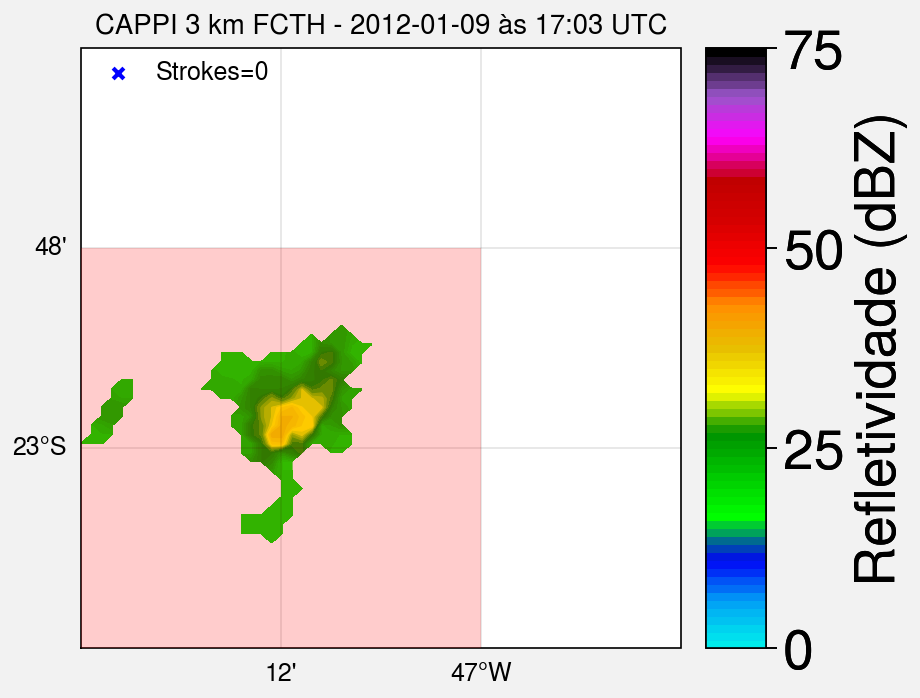

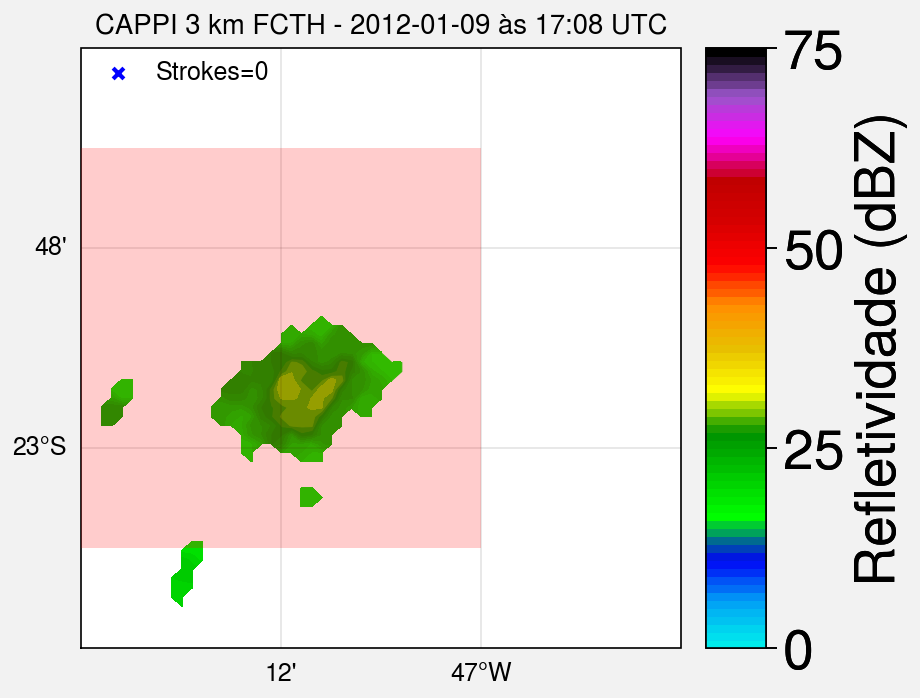

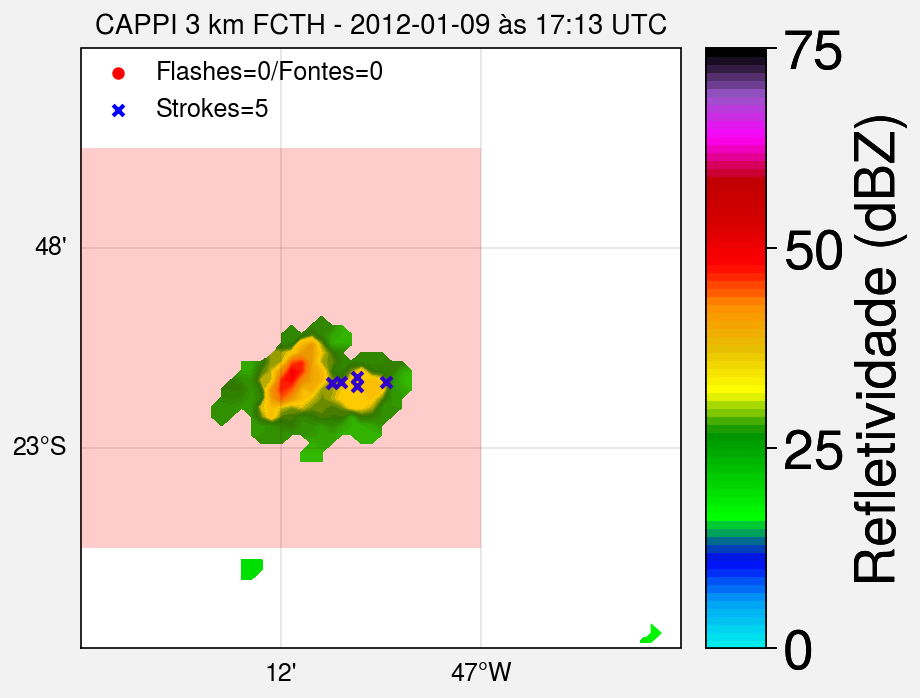

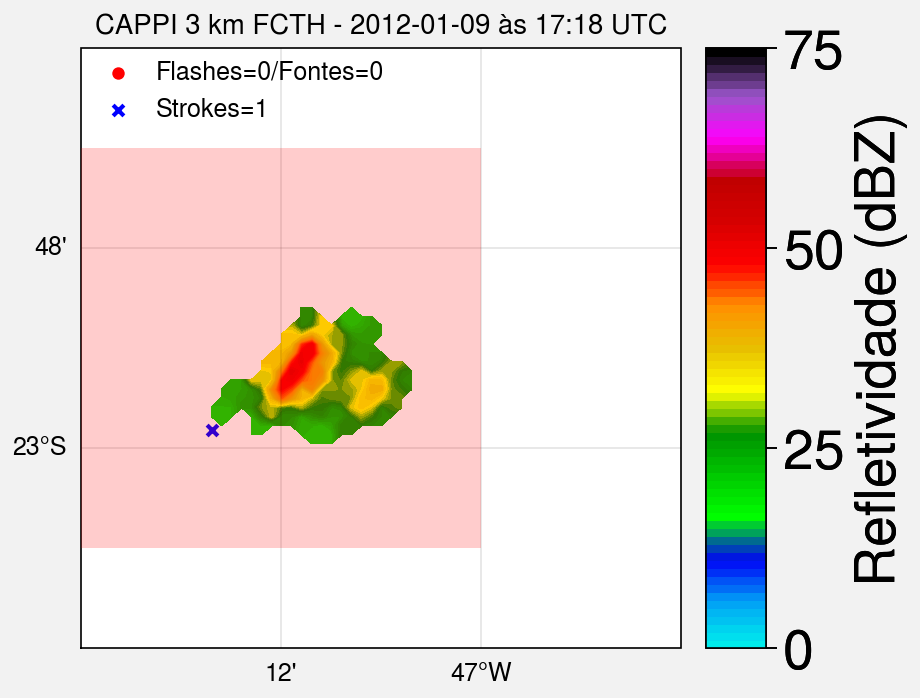

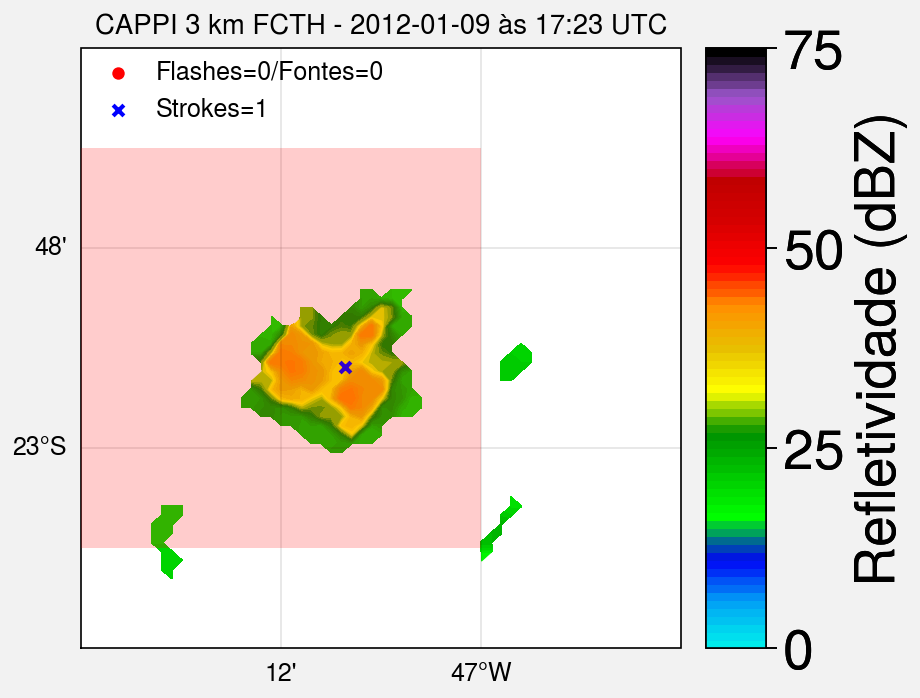

...

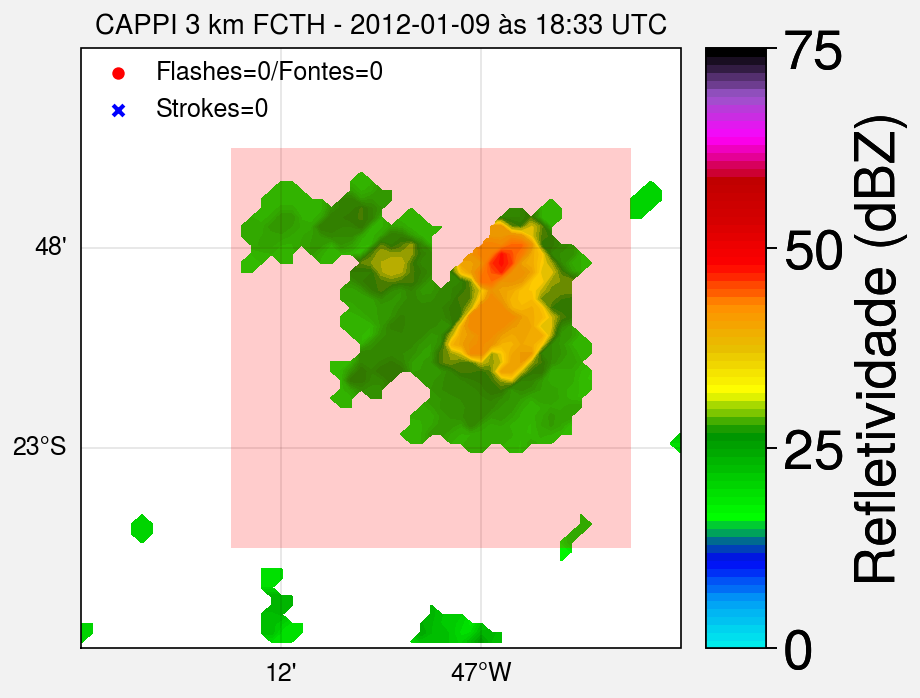

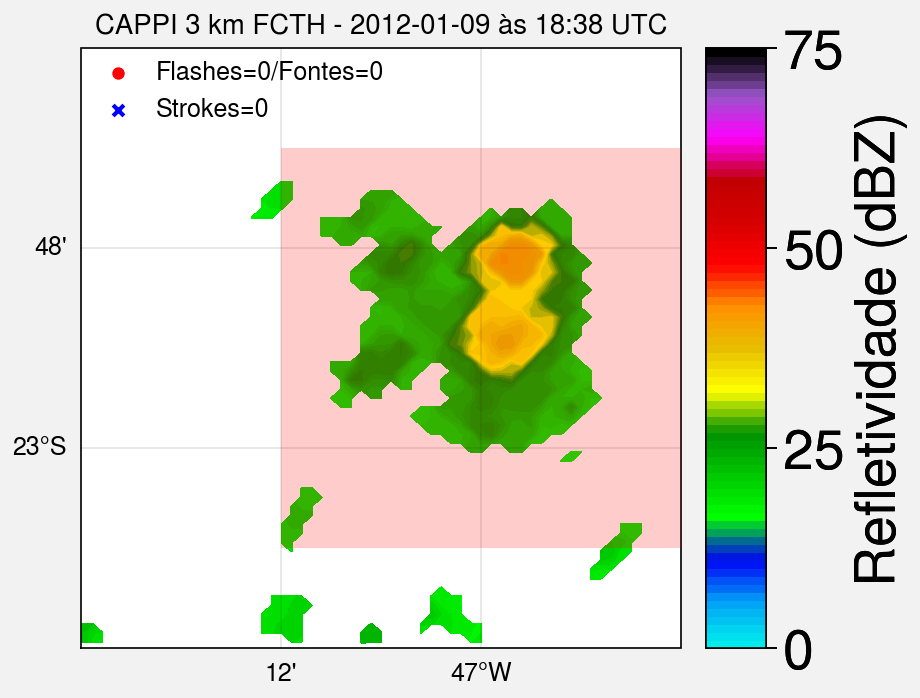

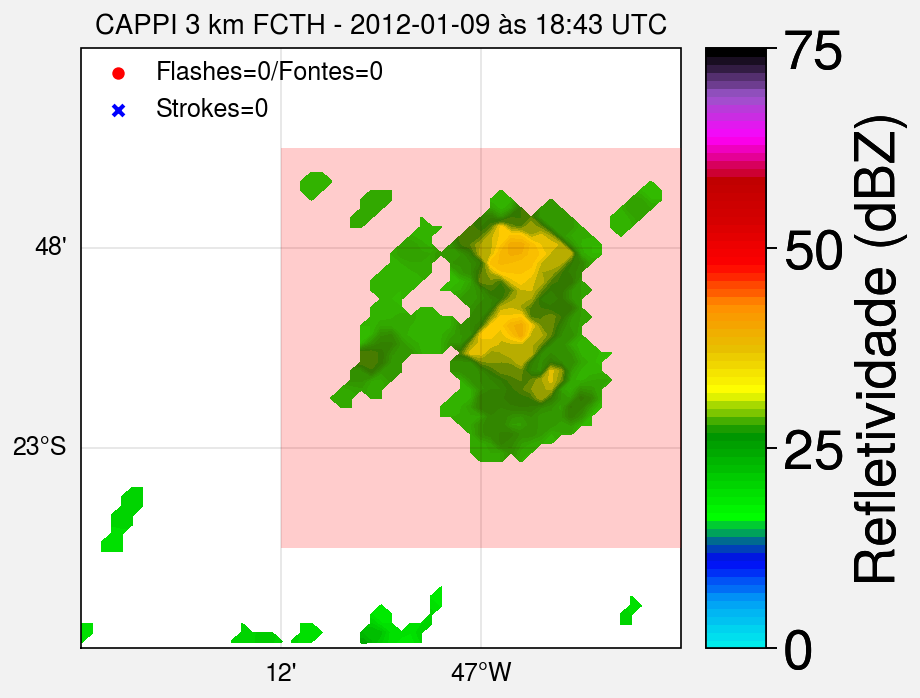

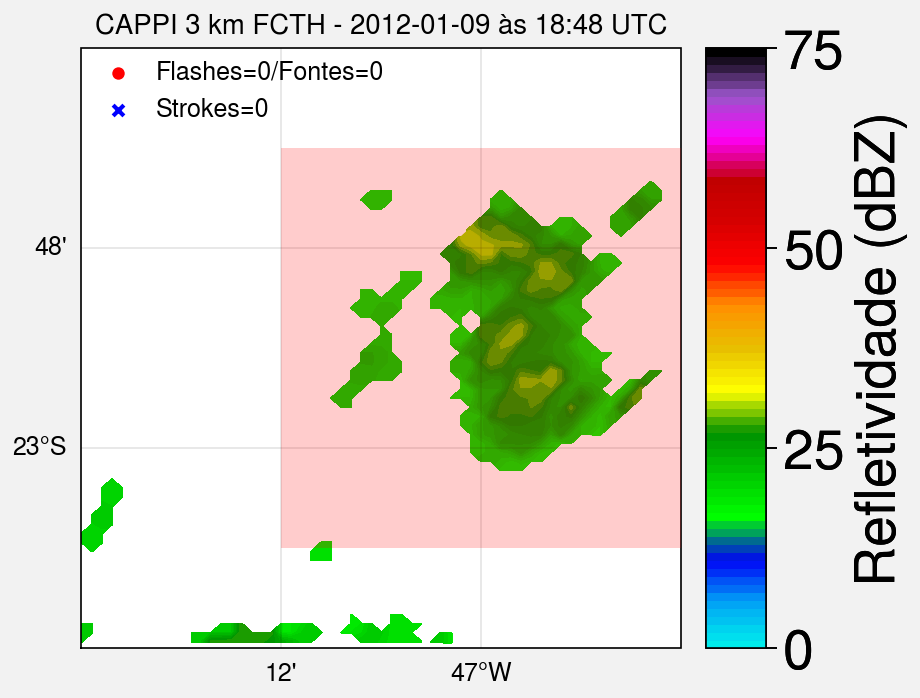

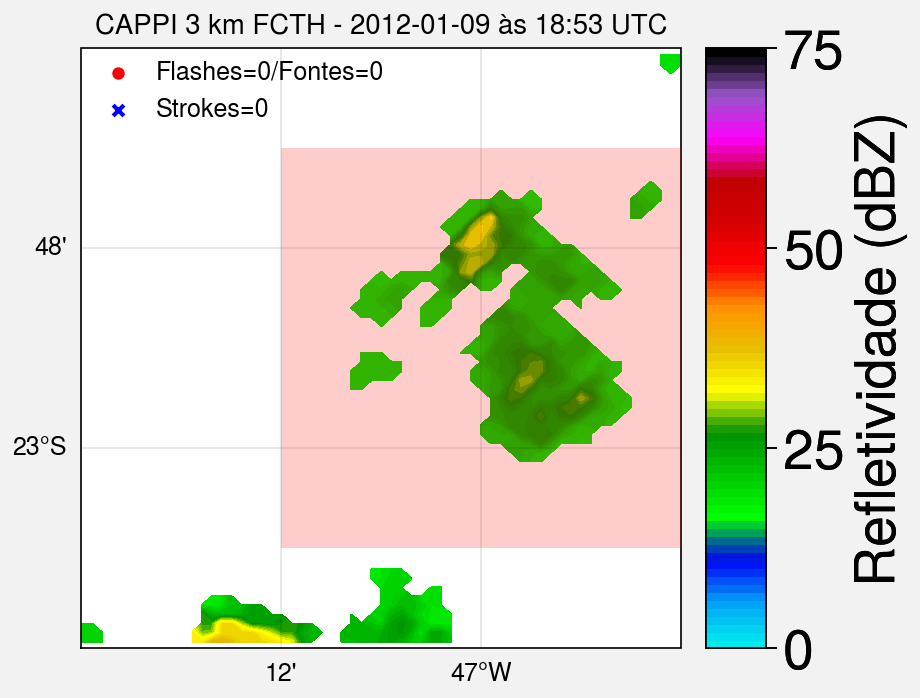

In [ ]:
# Imprime arquivo de rastreamento
fout = open(f'{path_output}rastreamento_tempestade.txt', 'w') 
fout.write(f' ANO   MES   DIA   HOR   MIN    LONMIN    LONMAX    LATMIN    LATMAX \n')

# Loop das imagens do radar
for file in tqdm_notebook(files_radar):
    
    # -----------------------------------------------------------# 
    #           EXTRAI AS INFORMAÇÕES DA IMAGEM DO RADAR
    # -----------------------------------------------------------# 
    # Nome zipado e dzipado do arquivo 
    filename_gz = file
    filename = filename_gz[0:-3]
    
    # Extrai data e hora
    ano, mes, dia, hor, minu = filename[15:19], filename[19:21], filename[21:23], filename[24:26], filename[26:28]
    print(f'PROCESSANDO......>>>> {ano}{mes}{dia}_{hor}{minu}')

    # Data inicial e final do ScanTime do radar em formato de "CARACTER"
    data_str_ini = str(datetime(int(ano), int(mes), int(dia), int(hor), int(minu), 0, 1))                                               # tempo inicial da imagem do radar
    data_str_end = str(datetime.strptime(data_str_ini, '%Y-%m-%d %H:%M:%S.%f') + timedelta(minutes=4, seconds=59, microseconds=999998)) # tempo final da imagem do radar (+5min)

    # -----------------------------------------------------------# 
    #         ABRE ARQUIVO DE SAÍDA DE LMA E BRASILDAT
    # -----------------------------------------------------------# 
    filename_raios = f'{path_output}tempestade_{ano}{mes}{dia}_{hor}{minu}.csv' # tempestade_7_20120109_1713.csv
    fout_raios = open(filename_raios, 'w')

    # -----------------------------------------------------------# 
    #             LEITURA DO BINÁRIO DO RADAR
    # -----------------------------------------------------------# 
    # descompacta arquivo (transforma de 'cappi_CZ_03000_20111213_2210.dat.gz' para 'cappi_CZ_03000_20111213_2210.dat') 
    with gzip.open(f'/content/{filename_gz}', 'rb') as entrada:
        with open(f'/content/{filename}', 'wb') as saida:
            shutil.copyfileobj(entrada, saida)
        
    # leitura do arquivo binário do radar
    dados0 = np.fromfile(f'/content/{filename}', np.float32)

    # reprojeta o dado de 1D para matriz 2D
    dados1 = dados0.reshape(ny, nx)      

    # mascara refletividade menor que 0 dBZ      
    dados = np.ma.masked_array(dados1, dados1 < 0.)  

    # -----------------------------------------------------------# 
    #   TRANSFORMA O ARQUIVO DO RADAR DE BINÁRIO PARA NETCDF
    # -----------------------------------------------------------# 
    # gerando dataset em formato netcdf
    data_vars = {'dbz':(('lat', 'lon'), dados, {'units': 'dBZ', 'long_name':'refletividade FCTH'})}
    coords = {'lat': lats, 'lon': lons}
    attrs = {'creation_data':str(datetime.now()), 'author':'Enrique', 'email': 'enrique.vmattos@gmail.com'}
    ds = xr.Dataset(data_vars=data_vars, coords=coords, attrs=attrs)

    # faz o recorte no arquivo NetCdf
    ds = ds.sel(lon=slice(lonmin_rec, lonmax_rec), lat=slice(latmin_rec, latmax_rec))

    #------------------------------------------------------#
    #         PLOTA CAPPI DE REFLETIVIDADE DO RADAR
    #------------------------------------------------------# 
    # cria a moldura da figura axheight=5, 
    fig, ax = plot.subplots(axheight=3, tight=True, proj='pcarree')

    # formatação dos eixos
    ax.format(coast=False, borders=False, innerborders=False, labels=True, latlines=0.2, lonlines=0.2,
              title=f'CAPPI 3 km FCTH - {ano}-{mes}-{dia} às {hor}:{minu} UTC', 
              latlim=(latmin_rec, latmax_rec), lonlim=(lonmin_rec, lonmax_rec), fontsize=11)

    # plota contornos
    evm_plot_states(f'{dir_shapefiles}BR_UF_2019.shp')
    evm_plot_states(f'{dir_shapefiles}shapefile_rmsp.shp')

    # plota figura
    map1 = ax.contourf(ds['lon'], ds['lat'], ds['dbz'], cmap='pyart_NWSRef', levels=plot.arange(0., 75., 1.0),  extent=[lonmin_rec, lonmax_rec, latmin_rec, latmax_rec])

    # plota quadrado de rastreamento da tempestade
    lonmin_rast, lonmax_rast, latmin_rast, latmax_rast = delimita_storm(f'{hor}{minu}')
    
    # plota barra de cores
    fig.colorbar(map1, loc='r', label='Refletividade (dBZ)', ticks=25, ticklabelsize=20, labelsize=20, width=0.3)

    #------------------------------------------------------#
    #         IMPRIME ARQUIVO DE RASTREAMENTO
    #------------------------------------------------------# 
    fout.write(f'{ano}    {mes}    {dia}    {hor}    {minu}  {lonmin_rast:.4f}  {lonmax_rast:.4f}  {latmin_rast:.4f}  {latmax_rast:.4f} \n') 

    #------------------------------------------------------#
    #                 PLOTA SPLMA
    #------------------------------------------------------# 
    # Procura arquivos da SPLMA dentro do tempo do ScanTime do radar
    df_arqlma2 = df_arqlma.loc[data_str_ini : data_str_end]

    i = 0         # contador dos arquivos de LMA dentro do Scantime do radar
    nfontes = 0   # quantidade de fontes dentro do Scantime do radar
    nflashes = 0  # quantidade de flashes dentro do Scantime do radar

    # Loop dos arquivos da SPLMA dentro do tempo do ScanTime do radar
    for j, filex in df_arqlma2.iterrows():

        # ------------------------------------- # 
        #         LEITURA DA TABELA 
        # ------------------------------------- #  
        df_lma = pd.read_csv(filex['nome'], names=['area(km2)','duracao(s)','comprimento(km)','ano','mes','dia','hor','min','seg','lat','lon','alt(m)'], delimiter='\s+', header=0)
        fontes = df_lma.shape[0] # extrae a quantidade de linhas (=quantidade de fontes) daquel DataFrame

        # seleciona relâmpagos dentro do quadrado
        df_lma2 = df_lma[ (df_lma['lat'] >= latmin_rast) & (df_lma['lat'] <= latmax_rast) & (df_lma['lon'] >= lonmin_rast) & (df_lma['lon'] <= lonmax_rast)]
        fontes2 = df_lma2.shape[0]

        # --------------------------------------------------------------- #
        # SE O ARQUIVO_LMA TEM ALGUMA FONTE DENTRO DA ÁREA DE RASTREAMENTO
        # --------------------------------------------------------------- #
        if fontes2 >= 1:

            # ------------------------------------- # 
            #         QUANTIDADE DE FONTES 
            # ------------------------------------- # 
            # quantidade de fontes de VHF daquela imagem de radar
            nfontes+=fontes # nfontes = nfontes + fontes
        
            # quantidade de flashes da SPLMA daquela imagem de radar
            nflashes+=1

            # ------------------------------------- # 
            #       IMPRIME OS FLASHES DA SPLMA 
            # ------------------------------------- # 
            # imprime cabeçalho 1 
            fout_raios.write(f'INI_FLASH_LMA={str(nflashes)};Fontes={str(fontes)} \n') 

            # imprime cabeçalho 2
            fout_raios.write(f'area(km2);duracao(s);comprimento(km);ano;mes;dia;hor;min;seg;lat;lon;alt(m) \n')
            
            # transforma de DataFrame para um Array do NumPy
            a = df_lma.to_numpy() 
   
            # loop nas linhas do array (=linhas das fontes)
            for ix, ilma in enumerate(a):
                fout_raios.write(f'{ilma[0]:.2f};{ilma[1]:.6f};{ilma[2]:.2f};{int(ilma[3])};{int(ilma[4])};{int(ilma[5])};{int(ilma[6])};{int(ilma[7])};{ilma[8]:.6f};{ilma[9]:.4f};{ilma[10]:.4f};{ilma[11]:.4f}\n') 

            # imprime fim
            fout_raios.write(f'END_FLASH_LMA \n') 
            fout_raios.write(f' \n') 

        # ------------------------------------- # 
        #       PLOTA AS FONTES 
        # ------------------------------------- # 
        # plota as fontes em formato scatter
        if (i == df_arqlma2.shape[0]-1):                                                    # último aquivo da SPLMA daquele Scantime do radar
            ax.scatter(df_lma['lon'].values, df_lma['lat'].values, transform=ccrs.PlateCarree(), marker='o', s=15, 
                       color='red', label=f'Flashes={str(nflashes)}/Fontes={str(nfontes)}')
        else:
            ax.scatter(df_lma['lon'].values, df_lma['lat'].values, transform=ccrs.PlateCarree(), marker='o', s=25, color='red') 
        i+=1

    #------------------------------------------------------#
    #               PLOTA BRASILDAT
    #------------------------------------------------------# 
    # LIMITAÇÃO TEMPORAL: Procura na tabela da Brasildat, relâmpagos dentro do ScanTime da imagem do radar
    df_bra4 = df_bra2.loc[data_str_ini : data_str_end]

    # LIMITAÇÃO ESPACIAL: seleciona relâmpagos dentro do quadrado
    df_bra5 = df_bra4[ (df_bra4['lat'] >= latmin_rast) & (df_bra4['lat'] <= latmax_rast) & (df_bra4['lon'] >= lonmin_rast) & (df_bra4['lon'] <= lonmax_rast)]

    # plota os relâmpagos
    ax.scatter(df_bra5['lon'].values, df_bra5['lat'].values, transform=ccrs.PlateCarree(), marker='x', s=15, color='b', label=f'Strokes={str(df_bra5.shape[0])}') 

    # salva num arquivo de saida
    fout_raios.write(f'INI_FLASH_BRASILDAT={str(df_bra5.shape[0])} \n') 
    
    # imprime cabeçalho
    fout_raios.write(f'tipo;ano;mes;dia;hor;min;seg;lat;lon;pc(kA) \n')
            
    # transforma de DataFrame para um array do numPy
    b = df_bra5.to_numpy() 
            
    # loop nas linhas do array (=linhas das fontes)
    for iy, ibra in enumerate(b):
        fout_raios.write(f'{ibra[0]};{int(ibra[1])};{int(ibra[2])};{int(ibra[3])};{int(ibra[4])};{int(ibra[5])};{ibra[6]:.6f};{ibra[7]:.4f};{ibra[8]:.4f};{ibra[9]:.4f}\n') 

    fout_raios.write(f'END_FLASH_BRASILDAT \n') 
    fout_raios.close() 
    #------------------------------------------------------# 

    #------------------------------------------------------#
    #               SALVA FIGURA
    #------------------------------------------------------# 
    # adiciona legenda
    ax.legend(loc='ul', ncols=1, frameon=False)
    
    # salva figura
    fig.save(f'{path_output}tempestade_zoom_cappi_3km_Z_FCTH_{ano}{mes}{dia}_{hor}{minu}.jpg', dpi=300) 
    
    #break 

fout.close() 

# **3) Faz animação de imagens**

In [ ]:
# Images we want to include in the GIF
files = sorted(glob.glob(f'{path_output}tempestade_zoom_*.jpg'))

# Create the GIF
images = []
for file in files:
    images.append(imageio.imread(file))
 
# Save the GIF
imageio.mimsave(f'{path_output}animation_tempestade.gif', images, fps=5)

# **4) Plota CAPPI**: forma de painel

In [ ]:
files_painel = ['cappi_CZ_03000_20120109_1703.dat.gz',                
                'cappi_CZ_03000_20120109_1713.dat.gz',
                'cappi_CZ_03000_20120109_1718.dat.gz',                
                'cappi_CZ_03000_20120109_1728.dat.gz', 
                'cappi_CZ_03000_20120109_1743.dat.gz', 
                'cappi_CZ_03000_20120109_1748.dat.gz',
                'cappi_CZ_03000_20120109_1753.dat.gz',
                'cappi_CZ_03000_20120109_1758.dat.gz', 

                'cappi_CZ_03000_20120109_1803.dat.gz', 
                'cappi_CZ_03000_20120109_1808.dat.gz',
                'cappi_CZ_03000_20120109_1813.dat.gz',                
                'cappi_CZ_03000_20120109_1818.dat.gz',
                'cappi_CZ_03000_20120109_1828.dat.gz', 
                'cappi_CZ_03000_20120109_1833.dat.gz',                
                'cappi_CZ_03000_20120109_1843.dat.gz',
                'cappi_CZ_03000_20120109_1853.dat.gz'] 

#1703 - 1853
print(len(files_painel))

16


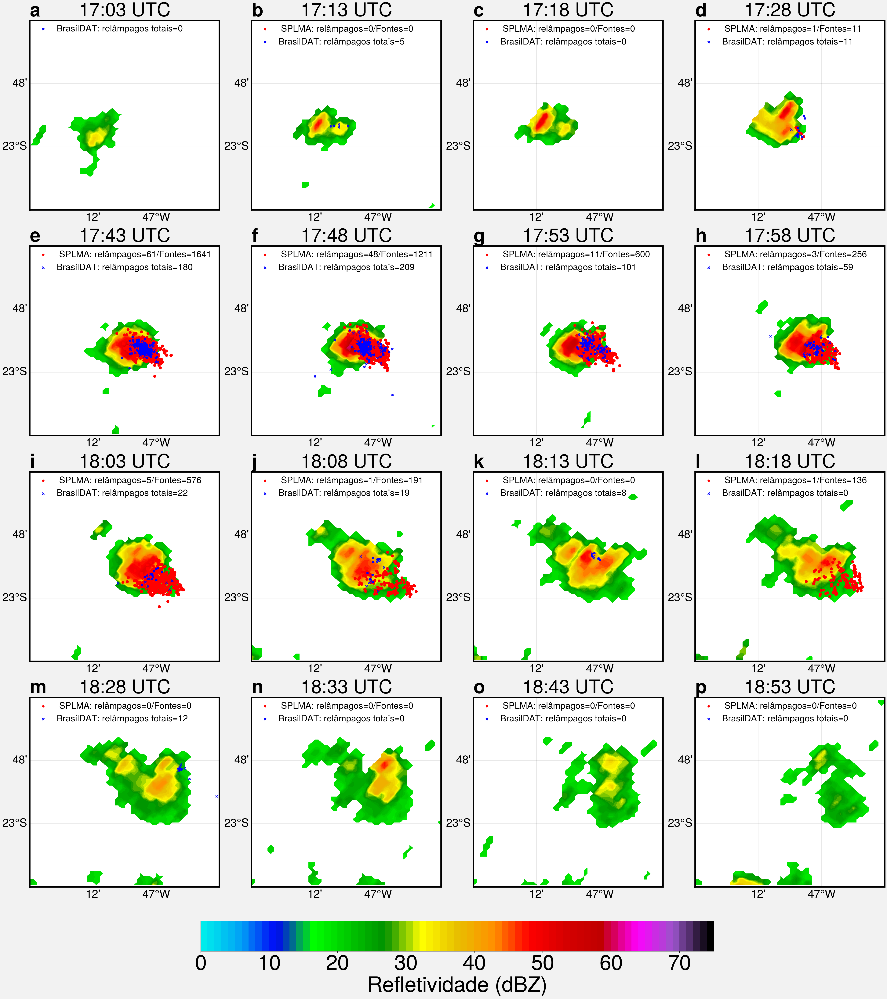

In [ ]:
# Cria a moldura da figura   
fig, ax = plot.subplots(axheight=5, ncols=4, nrows=4, tight=True, proj='pcarree')

# Formatação dos eixos
ax.format(coast=False, borders=False, innerborders=False, labels=True, latlines=0.2, lonlines=0.2,
          title=f'CAPPI 3 km FCTH', 
          latlim=(latmin_rec, latmax_rec), lonlim=(lonmin_rec, lonmax_rec),  
          abc='(A)', small='30px', large='50px', linewidth=2.8)

# Plota contornos
evm_plot_states(f'{dir_shapefiles}BR_UF_2019.shp')
evm_plot_states(f'{dir_shapefiles}shapefile_rmsp.shp')

# Loop dos arquivos
for i, file in enumerate(files_painel):

    # Nome zipado e dzipado do arquivo 
    filename_gz = file
    filename = filename_gz[0:-3]

    # Extrai o nome do arquivo: cappi_CZ_03000_20120107_1717.dat.gz
    arquivo = os.path.basename(os.path.splitext(file)[0])

    # Extrai a data e horario do arquivo    
    alt_cappi, ano, mes, dia, hor, minu = arquivo[9:14], arquivo[15:19], arquivo[19:21], arquivo[21:23], arquivo[24:26], arquivo[26:28]

    # Data inicial e final do ScanTime do radar em formato de CARACTER
    data_str_ini = str(datetime(int(ano), int(mes), int(dia), int(hor), int(minu), 0, 1))
    data_str_end = str(datetime.strptime(data_str_ini, '%Y-%m-%d %H:%M:%S.%f') + timedelta(minutes=4, seconds=59, microseconds=999998))

    # Descompacta arquivo .gz 
    with gzip.open(f'/content/{filename_gz}', 'rb') as entrada:
        with open(f'/content/{filename}', 'wb') as saida:
            shutil.copyfileobj(entrada, saida)
        
    # Leitura do dado
    dados0 = np.fromfile(f'/content/{filename}', np.float32)
    dados1 = dados0.reshape(ny, nx)
    dados = np.ma.masked_array(dados1, dados1 < 0.)  

    # É necessário inverter o eixo y (é o eixo das latiudes):
    #dados = np.flipud(dados)

    # -----------------------------------------------------------# 
    #        Transforma o dado binário para Netcdf
    # -----------------------------------------------------------# 
    # Salva em arquivo Netcdf
    data_vars = {'dbz':(('lat', 'lon'), dados, {'units': 'dBZ', 'long_name':'refletividade FCTH'})}
    coords = {'lat': lats, 'lon': lons}
    attrs = {'creation_data':str(datetime.now()), 'author':'Enrique', 'email': 'enrique@gmail.com'}
    ds = xr.Dataset(data_vars=data_vars, coords=coords, attrs=attrs)

    # faz o recorte no arquivo NetCdf
    ds = ds.sel(lon=slice(lonmin_rec, lonmax_rec), lat=slice(latmin_rec, latmax_rec))
    
    # plota figura    
    if i == 0: 
        map1 = ax[i].contourf(ds['lon'], ds['lat'], ds['dbz'], cmap='pyart_NWSRef', levels=plot.arange(0., 75., 1.0),  extent=[lonmin_rec, lonmax_rec, latmin_rec, latmax_rec])
    else:
        ax[i].contourf(ds['lon'], ds['lat'], ds['dbz'], cmap='pyart_NWSRef', levels=plot.arange(0., 75., 1.0),  extent=[lonmin_rec, lonmax_rec, latmin_rec, latmax_rec])
   
    
    # plota quadrado de rastreamento da tempestade
    #lonmin_rast, lonmax_rast, latmin_rast, latmax_rast = delimita_storm(f'{hor}{minu}')
    #ax[i].fill_between((lonmin_rast, lonmax_rast), *(latmin_rast, latmax_rast), zorder=3, edgecolor='gray', facecolor=plot.set_alpha('gray', 0.3))

    # plota titulo de cada figura
    ax[i].format(title=f'{hor}:{minu} UTC')  


    #------------------------------------------------------#
    #                 Plota SPLMA
    #------------------------------------------------------# 
    # Procura arquivos da SPLMA dentro do tempo do ScanTime do radar
    df_arqlma2 = df_arqlma.loc[data_str_ini : data_str_end]

    # Loop dos arquivos da SPLMA dentro do tempo do ScanTime do radar
    ii = 0        # contador dos arquivos de LMA dentro do Scantime do radar
    nfontes = 0   # quantidade de fontes dentro do Scantime do radar
    nflashes = 0  # quantidade de flashes dentro do Scantime do radar

    # Loop dos arquivos da SPLMA dentro do tempo do ScanTime do radar
    for j, filex in df_arqlma2.iterrows():

        # ------------------------------------- # 
        #         LEITURA DA TABELA 
        # ------------------------------------- #  
        df_lma = pd.read_csv(filex['nome'], names=['area(km2)','duracao(s)','comprimento(km)','ano','mes','dia','hor','min','seg','lat','lon','alt(m)'], delimiter='\s+', header=0)
        fontes = df_lma.shape[0]

        # seleciona relâmpagos dentro do quadrado
        df_lma2 = df_lma[ (df_lma['lat'] >= latmin_rast) & (df_lma['lat'] <= latmax_rast) & (df_lma['lon'] >= lonmin_rast) & (df_lma['lon'] <= lonmax_rast)]
        fontes2 = df_lma2.shape[0]
  

        # --------------------------------------------------------------- #
        # SE O ARQUIVO_LMA TEM ALGUMA FONTE DENTRO DA ÁREA DE RASTREAMENTO
        # --------------------------------------------------------------- #
        if fontes2 >= 1:

            # ------------------------------------- # 
            #         QUANTIDADE DE FONTES 
            # ------------------------------------- # 
            # quantidade de fontes de VHF daquela imagem de radar
            nfontes+=fontes
        
            # quantidade de flashes da SPLMA daquela imagem de radar
            nflashes+=1    
            

        # ------------------------------------- # 
        #       PLOTA AS FONTES 
        # ------------------------------------- # 
        # plota as fontes em formato scatter
        if (ii == df_arqlma2.shape[0]-1):                                                    # último aquivo da SPLMA daquele Scantime do radar
            ax[i].scatter(df_lma['lon'].values, df_lma['lat'].values, transform=ccrs.PlateCarree(), marker='o', s=15, 
                         color='red', label=f' SPLMA: relâmpagos={str(nflashes)}/Fontes={str(nfontes)}')
        else:
            ax[i].scatter(df_lma['lon'].values, df_lma['lat'].values, transform=ccrs.PlateCarree(), marker='o', s=25, color='red') 
        ii+=1
     

    #------------------------------------------------------#
    #               Plota Brasildat
    #------------------------------------------------------# 
    # Procura na tabela da Brasildat, relâmpagos dentro do tempo do relâmpago da SPLMA
    df_bra4 = df_bra2.loc[data_str_ini : data_str_end]

    # seleciona relâmpagos dentro do quadrado
    df_bra5 = df_bra4[ (df_bra4['lat'] >= latmin_rast) & (df_bra4['lat'] <= latmax_rast) & (df_bra4['lon'] >= lonmin_rast) & (df_bra4['lon'] <= lonmax_rast)]

    # plota os relâmpagos
    ax[i].scatter(df_bra5['lon'].values, df_bra5['lat'].values, transform=ccrs.PlateCarree(), marker='x', s=15, color='b', label=f'BrasilDAT: relâmpagos totais={str(df_bra5.shape[0])}') 
    #------------------------------------------------------# 

    # adiciona legenda
    ax[i].legend(loc='ul', ncols=1, frameon=False, prop={'size':17})
     
    
# plota barra de cores da figura
fig.colorbar(map1, loc='b', label='Refletividade (dBZ)', ticks=10, ticklabelsize=40, labelsize=40, space=0.9, length=0.60, width=0.8)


# salva figura
fig.save(f'{path_output}painel_tempestade.png', dpi=300)  
fig.save(f'{dir}Fig1_painel_tempestade.png', dpi=300) 
#plot.show()